In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
#--# 문제1
import pandas as pd
import sklearn.model_selection
#--# 문제4
import gymnasium as gym
import IPython
from matplotlib.animation import FuncAnimation
import collections
import random

# 4. `FrozenLake`

ref: <https://gymnasium.farama.org/environments/toy_text/frozen_lake/> 

아래는 OpenAI Gym 라이브러리에서 제공하는 환경 Frozen Lake를 구체화하여 변수 `env`에 저장하는 코드이다. 

In [2]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')

Frozen Lake 환경은 강화학습(RL) 실험을 위한 간단한 시뮬레이션 환경으로 에이전트가 얼어붙은 호수 위를 안전하게 건너 목표 지점에 도달하는 것이 목표이다. 주요 특징은 다음과 같다. 

`1`. **환경 구성**:

- 격자형(grid) 환경으로 이루어져 있으며, 각 격자는 4x4 또는 8x8의 형태를 가질 수 있다. (문제에서는 4x4) 
- 격자는 시작 지점(Start), 목표 지점(Goal), 얼음(Ice), 그리고 구멍(Hole)으로 구성된다.
- 에이전트는 시작 지점에서 목표 지점까지 이동해야 한다.

`2`. **에이전트의 동작**:

 - 에이전트는 상, 하, 좌, 우로 이동할 수 있다.
 - 얼음 위에서는 자유롭게 이동할 수 있지만, 구멍에 빠지면 에피소드가 종료된다.

`3`. **보상 체계**:

- 에이전트가 목표 지점에 도달하면 +1의 보상을 받는다.
- 그 외에는 보상이 없다(0 보상).
- 구멍에 빠지거나 목표 지점에 도달하지 못하면 보상은 없다.

`4`. **목표**:

 - 에이전트는 강화학습 알고리즘을 사용하여 최적의 경로를 학습하고, 가능한 한 구멍에 빠지지 않고 목표 지점에 도달하는 것이다.

아래는 `show` 함수이며, 이는 `env`의 현재상태를 렌더링해주는 역할을 한다. 

In [2]:
def show(imgs):
    fig = plt.Figure()
    ax = fig.subplots()
    def update(i):
        ax.imshow(imgs[i])
    ani = FuncAnimation(fig,update,frames=len(imgs))
    display(IPython.display.HTML(ani.to_jshtml()))

`show()` 함수의 사용방법은 아래와 같다. 

In [122]:
imgs = [] 
env.reset()
while True:
    img = env.render()
    imgs.append(img)
    #---#
    player.act()
    player.next_state, player.reward, player.terminated, player.truncated, _ = env.step(player.action)
    if player.terminated or player.truncated:
        break
    else:
        player.state = player.next_state
show(imgs)        

적당한 위의 환경에 대응하는 Agent를 설계하고 `q_net`를 이용하여 올바른 행동을 학습하라. (최근 100번의 평균점수가 0.9 이상이면 만점으로 인정)

**힌트1:** 아래의 에이전트를 설계에 활용하세요

In [123]:
class RandomAgent: 
    def __init__(self):
        #--# define spaces 
        self.action_space = gym.spaces.Discrete(4)
        #--# replay buffer 
        self.state =  None   
        self.action = None           
        self.reward = None           
        self.next_state = None      
        self.terminated = None
        self.truncated = None 
        #-#
        self.states = collections.deque(maxlen=5000)
        self.actions = collections.deque(maxlen=5000)
        self.rewards = collections.deque(maxlen=5000)
        self.next_states = collections.deque(maxlen=5000)
        self.terminations = collections.deque(maxlen=5000)
        #--# other information 
        self.n_experiences = 0
        self.eps = 1.0
    def act(self):
        self.action = self.action_space.sample()
    def learn(self):
        pass 
    def save_experience(self):
        self.states.append(torch.tensor(self.state))
        self.actions.append(self.action)
        self.rewards.append(self.reward)
        self.next_states.append(torch.tensor(self.next_state))
        self.terminations.append(self.terminated)
        #--#
        self.n_experiences = self.n_experiences + 1 

**힌트2**: `q_net`의 첫 레이어는 `torch.nn.Embedding()`을 이용하세요

- 상태공간(state space)이 0~15일텐데, `상태1 x 2 = 상태2`, `상태3 + 상태2 = 상태5` 와 같은 관계가 성립한다고 보기 어려우므로 상태공간은 범주형변수로 봐야겠죠?

**힌트3**: 학습이 잘 되지 않는다면 아래를 체크해보세요. 

- `q_net(s)`가 올바른 값을 주는지 확인합시다.
  - 예를들어 q_net(s)의 값은 0~1사이에 있어야 하겠구요,
  - 상태14에서는 오른쪽(action=2)으로 가야합니다. (액션값과 상태에 대한 정의값은 공식문서를 참고하세요)
- 네크워크를 엄청 복잡하게 할 필요는 없습니다. (저는 레이어3장썼고요.. 레이어에서 최대 노드수는 32를 넘지 않아요) 
- 그외 제가 학습에 사용한 여러 설정을 공유합니다. (아마 꼭 저대로 안해도 될걸요?)
    - GPU 사용 X
    - 학습시간: 5분쯤? 
    - 옵티마이저: 아담
    - 학습률: 디폴트
    - 배치사이즈: 128 
    - 랜덤액션 확률: 매 에피소드마다 "이전 확률 × 0.995" 방식으로 점차 감소 

In [130]:
#

에피소드: 100	 경험: 818	 점수: 0.12	 게임시간: 7.18	 돌발행동: 0.61	
에피소드: 200	 경험: 1538	 점수: 0.37	 게임시간: 6.20	 돌발행동: 0.37	
에피소드: 300	 경험: 2350	 점수: 0.72	 게임시간: 7.12	 돌발행동: 0.22	
에피소드: 400	 경험: 3013	 점수: 0.78	 게임시간: 5.63	 돌발행동: 0.13	
에피소드: 500	 경험: 3648	 점수: 0.89	 게임시간: 5.35	 돌발행동: 0.08	
--에피소드 542에서 클리어--


## 기존 풀이

### 탐색

```
액션 공간 (Action Space)
0: 왼쪽으로 이동
1: 아래로 이동
2: 오른쪽으로 이동
3: 위로 이동

관찰 공간 (Observation Space)
관찰값 = 플레이어의 현재 위치 = current_row*ncols + current_col(행과 열은 모두 0에서 시작)

시작 상태 (Starting State)
[0, 0]

보상 (Rewards)
목표 달성: +1
도달 구멍: 0
냉동 도달: 0

에피소드 종료 (Episode End)
종료: 구멍으로 이동 or 목표에 도달 max(nrow) * max(ncol) - 1 (location [max(nrow)-1, max(ncol)-1])
Truncation(when using the time_limit wrapper): 에피소드 길이는 100 (4X4 경우)

is_slippery=False
```

In [2]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')

In [3]:
env

<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>

In [4]:
env.observation_space

Discrete(16)

In [5]:
env.action_space

Discrete(4)

In [6]:
env.reset()

(0, {'prob': 1})

In [8]:
env.step??

Signature: env.step(action: 'ActType') -> 'tuple[ObsType, SupportsFloat, bool, bool, dict[str, Any]]'
Source:   
    def step(
        self, action: ActType
    ) -> tuple[ObsType, SupportsFloat, bool, bool, dict[str, Any]]:
        """Steps through the environment and if the number of steps elapsed exceeds ``max_episode_steps`` then truncate.

        Args:
            action: The environment step action

        Returns:
            The environment step ``(observation, reward, terminated, truncated, info)`` with `truncated=True`
            if the number of steps elapsed >= max episode steps

        """
        observation, reward, terminated, truncated, info = self.env.step(action)
        self._elapsed_steps += 1

        if self._elapsed_steps >= self._max_episode_steps:
            truncated = True

        return observation, reward, terminated, truncated, info
File:      ~/anaconda3/envs/dl2025/lib/python3.9/site-packages/gymnasium/wrappers/common.py
Type:      method

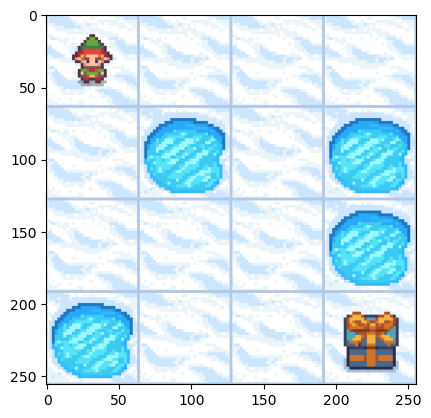

In [11]:
env.reset()
plt.imshow(env.render())

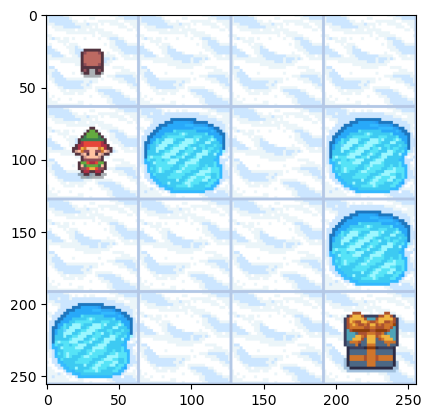

In [12]:
env.step(1)
plt.imshow(env.render())

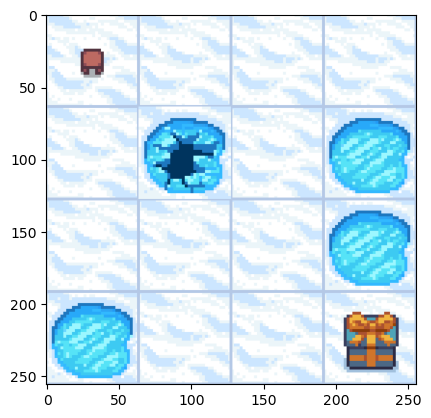

In [13]:
env.step(2)
plt.imshow(env.render())

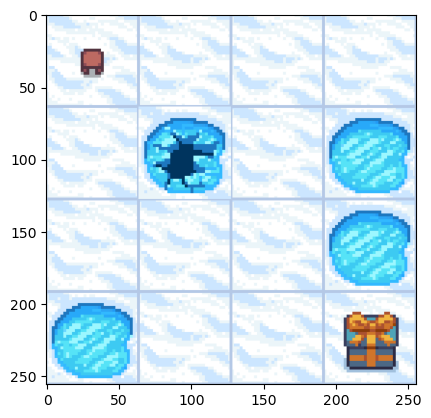

In [14]:
env.step(2)
plt.imshow(env.render())

In [15]:
print(env.step(2))

(5, 0, True, False, {'prob': 1.0})


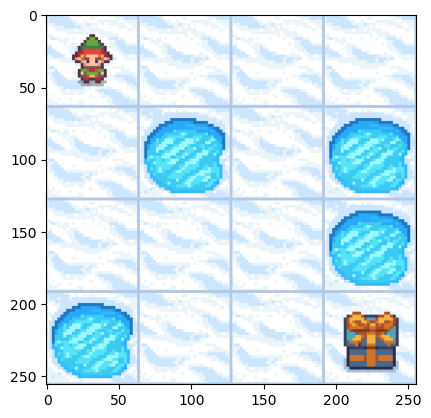

In [16]:
env.reset()
plt.imshow(env.render())

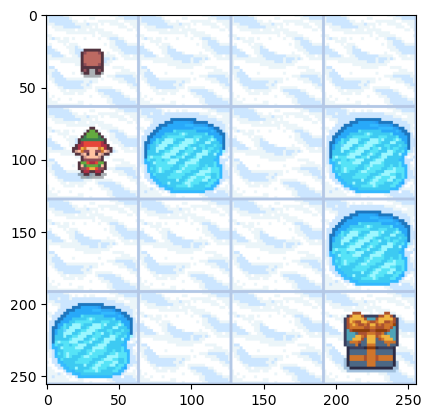

In [17]:
env.step(1)
plt.imshow(env.render())

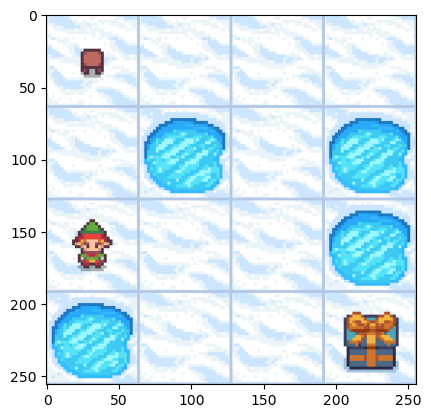

In [18]:
env.step(1)
plt.imshow(env.render())

In [19]:
print(env.step(2))

(9, 0.0, False, False, {'prob': 1.0})


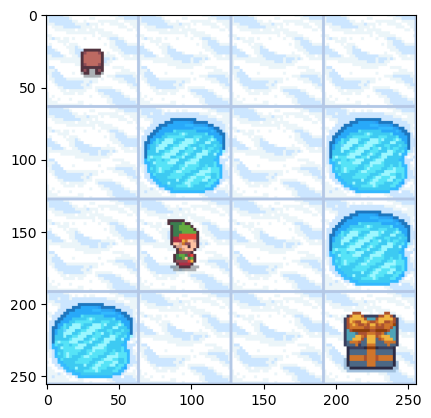

In [20]:
plt.imshow(env.render())

In [21]:
print(env.step(2))

(10, 0.0, False, False, {'prob': 1.0})


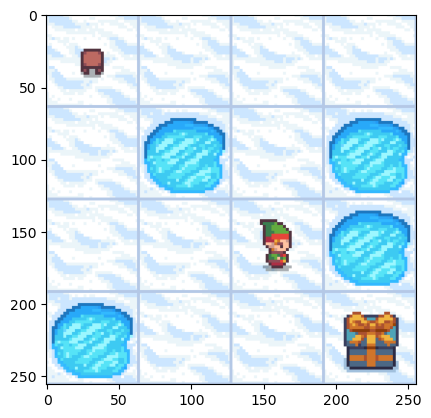

In [22]:
plt.imshow(env.render())

In [23]:
print(env.step(1))

(14, 0.0, False, False, {'prob': 1.0})


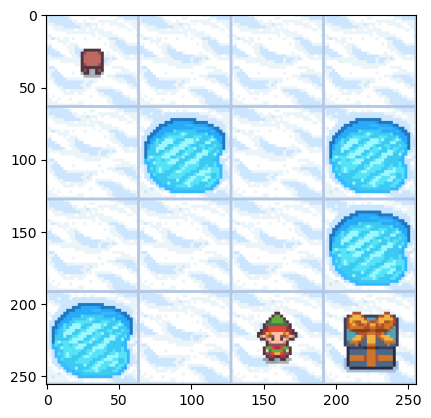

In [24]:
plt.imshow(env.render())

In [25]:
print(env.step(2))

(15, 1.0, True, False, {'prob': 1.0})


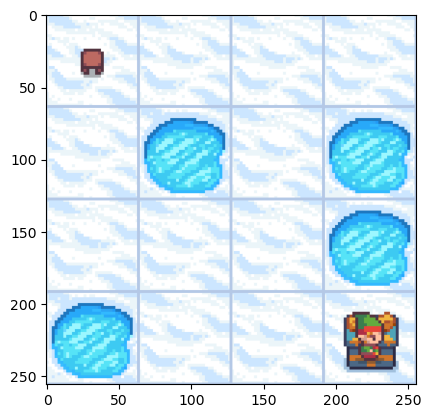

In [26]:
plt.imshow(env.render())

- next observation, reward, terminated, truncated, info

### RandomAgent

In [3]:
class RandomAgent: 
    def __init__(self):
        #--# define spaces 
        self.action_space = gym.spaces.Discrete(4)
        #--# replay buffer 
        self.state =  None   
        self.action = None           
        self.reward = None           
        self.next_state = None      
        self.terminated = None
        self.truncated = None 
        #-#
        self.states = collections.deque(maxlen=5000)
        self.actions = collections.deque(maxlen=5000)
        self.rewards = collections.deque(maxlen=5000)
        self.next_states = collections.deque(maxlen=5000)
        self.terminations = collections.deque(maxlen=5000)
        #--# other information 
        self.n_experiences = 0
        self.eps = 1.0
    def act(self):
        self.action = self.action_space.sample()
    def learn(self):
        pass 
    def save_experience(self):
        self.states.append(torch.tensor(self.state))
        self.actions.append(self.action)
        self.rewards.append(self.reward)
        self.next_states.append(torch.tensor(self.next_state))
        self.terminations.append(self.terminated)
        #--#
        self.n_experiences = self.n_experiences + 1 

In [28]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player = RandomAgent()
player.state,_ = env.reset()
for e in range(1,101):
    while True:
        # step1
        player.act()
        # step2
        player.next_state, player.reward, player.terminated, player.truncated, _ = env.step(player.action)
        # step3
        player.save_experience()
        player.learn()
        # step4
        if player.terminated or player.truncated:
            player.state, _ = env.reset()
            break
        else:
            player.state = player.next_state

### q_net

In [29]:
state = player.states[100]
action = player.actions[100]
reward = player.rewards[100]
next_state = player.next_states[100]
terminated = player.terminations[100]

In [31]:
player.q_net = torch.nn.Sequential(
            torch.nn.Embedding(16, 16),
            torch.nn.Linear(16, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 4),
            torch.nn.Sigmoid()
        )

In [32]:
player.q_net(state)

tensor([0.5032, 0.4611, 0.4855, 0.4677], grad_fn=<SigmoidBackward0>)

### Agent

In [162]:
class Agent(RandomAgent):
    def __init__(self):
        super().__init__()
        self.q_net = torch.nn.Sequential(
            torch.nn.Embedding(16, 16),
            torch.nn.Linear(16, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 4),
            torch.nn.Sigmoid()
        )
        self.optimizr = torch.optim.Adam(self.q_net.parameters())
    def act(self):
        if random.random() < self.eps: 
            self.action = self.action_space.sample()
        else:
            state = torch.tensor(self.state)
            self.action = self.q_net(state).argmax().item()
    def learn(self):
        if self.n_experiences > 128:
            for epoc in range(1):
                memory = list(zip(self.states, self.actions, self.rewards, self.next_states, self.terminations))
                mini_batch = random.sample(memory,128)
                # step1-2 
                loss = 0
                for s,a,r,ss,tmd in mini_batch:
                    q_hat = self.q_net(s)[a]
                    if tmd: 
                        q = r 
                    else: 
                        future = self.q_net(ss).max().data 
                        q = r + 0.99 * future
                    loss = loss + (q_hat-q)**2
                loss = loss / 128
                # step3
                loss.backward()
                # step4 
                self.optimizr.step()
                self.optimizr.zero_grad()        

### Solve

In [133]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player = Agent()
player.state, _ = env.reset()
score = 0
playtime = 0
scores = [] 
playtimes = []
#---#
for e in range(1,2001):
    #---에피소드시작---#
    while True:
        #step1
        player.act()
        #step2
        player.next_state, player.reward, player.terminated, player.truncated, _ = env.step(player.action)
        #step3
        player.save_experience()
        player.learn()
        #step4
        if player.terminated or player.truncated:
            score = score + player.reward
            scores.append(score)
            score = 0
            playtimes.append(playtime)
            playtime = 0
            player.state, _ = env.reset()
            break
        else: 
            score = score + player.reward
            playtime = playtime + 1 
            player.state = player.next_state
    #---에피소드끝---#
    player.eps = player.eps * 0.995
    if (e % 50) ==0:
        print(
            f"에피소드: {e}\t",
            f"경험: {player.n_experiences}\t",
            f"점수(평균): {np.mean(scores[-100:]):.2f}\t",
            f"게임시간(평균): {np.mean(playtimes[-100:]):.2f}\t",
            f"돌발행동: {player.eps:.2f}\t",
        )
    if np.mean(scores[-100:]) > 0.9:
        print(f"--에피소드{e}에서 클리어--")
        break

에피소드: 50	 경험: 384	 점수(평균): 0.00	 게임시간(평균): 6.68	 돌발행동: 0.78	
에피소드: 100	 경험: 866	 점수(평균): 0.05	 게임시간(평균): 7.66	 돌발행동: 0.61	
에피소드: 150	 경험: 1226	 점수(평균): 0.19	 게임시간(평균): 7.42	 돌발행동: 0.47	
에피소드: 200	 경험: 1604	 점수(평균): 0.42	 게임시간(평균): 6.38	 돌발행동: 0.37	
에피소드: 250	 경험: 1944	 점수(평균): 0.56	 게임시간(평균): 6.18	 돌발행동: 0.29	
에피소드: 300	 경험: 2381	 점수(평균): 0.69	 게임시간(평균): 6.77	 돌발행동: 0.22	
에피소드: 350	 경험: 2746	 점수(평균): 0.83	 게임시간(평균): 7.02	 돌발행동: 0.17	
에피소드: 400	 경험: 3097	 점수(평균): 0.83	 게임시간(평균): 6.16	 돌발행동: 0.13	
에피소드: 450	 경험: 3464	 점수(평균): 0.80	 게임시간(평균): 6.18	 돌발행동: 0.10	
에피소드: 500	 경험: 3879	 점수(평균): 0.78	 게임시간(평균): 6.82	 돌발행동: 0.08	
에피소드: 550	 경험: 4262	 점수(평균): 0.83	 게임시간(평균): 6.98	 돌발행동: 0.06	
에피소드: 600	 경험: 4694	 점수(평균): 0.89	 게임시간(평균): 7.15	 돌발행동: 0.05	
--에피소드637에서 클리어--


In [166]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player = Agent()
player.state, _ = env.reset()
score = 0
playtime = 0
scores = [] 
playtimes = []
#---#
for e in range(1,2001):
    #---에피소드시작---#
    while True:
        #step1
        player.act()
        #step2
        player.next_state, player.reward, player.terminated, player.truncated, _ = env.step(player.action)
        #step3
        player.save_experience()
        player.learn()
        #step4
        if player.terminated or player.truncated:
            score = score + player.reward
            scores.append(score)
            score = 0
            playtimes.append(playtime)
            playtime = 0
            player.state, _ = env.reset()
            break
        else: 
            score = score + player.reward
            playtime = playtime + 1 
            player.state = player.next_state
    #---에피소드끝---#
    player.eps = player.eps * 0.995
    if (e % 50) ==0:
        print(
            f"에피소드: {e}\t",
            f"경험: {player.n_experiences}\t",
            f"점수(평균): {np.mean(scores[-100:]):.2f}\t",
            f"게임시간(평균): {np.mean(playtimes[-100:]):.2f}\t",
            f"돌발행동: {player.eps:.2f}\t",
        )
    if np.mean(scores[-100:]) > 0.9:
        print(f"--에피소드{e}에서 클리어--")
        break

에피소드: 50	 경험: 320	 점수(평균): 0.00	 게임시간(평균): 5.40	 돌발행동: 0.78	
에피소드: 100	 경험: 734	 점수(평균): 0.00	 게임시간(평균): 6.34	 돌발행동: 0.61	
에피소드: 150	 경험: 1230	 점수(평균): 0.11	 게임시간(평균): 8.10	 돌발행동: 0.47	
에피소드: 200	 경험: 1619	 점수(평균): 0.38	 게임시간(평균): 7.85	 돌발행동: 0.37	
에피소드: 250	 경험: 1930	 점수(평균): 0.57	 게임시간(평균): 6.00	 돌발행동: 0.29	
에피소드: 300	 경험: 2261	 점수(평균): 0.66	 게임시간(평균): 5.42	 돌발행동: 0.22	
에피소드: 350	 경험: 2596	 점수(평균): 0.77	 게임시간(평균): 5.66	 돌발행동: 0.17	
에피소드: 400	 경험: 2921	 점수(평균): 0.83	 게임시간(평균): 5.60	 돌발행동: 0.13	
에피소드: 450	 경험: 3241	 점수(평균): 0.87	 게임시간(평균): 5.45	 돌발행동: 0.10	
에피소드: 500	 경험: 3557	 점수(평균): 0.89	 게임시간(평균): 5.36	 돌발행동: 0.08	
에피소드: 550	 경험: 3892	 점수(평균): 0.87	 게임시간(평균): 5.51	 돌발행동: 0.06	
--에피소드565에서 클리어--


In [204]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player_dummy = Agent()
player_dummy.q_net.load_state_dict(
    torch.load("swk4.pth")
)
player_dummy.state, _ = env.reset()
imgs = []
player_dummy.eps = 0

while True:
    img = env.render()
    imgs.append(img)
    
    player_dummy.act()
    player_dummy.next_state, player_dummy.reward, player_dummy.terminated, player_dummy.truncated, _ = env.step(player_dummy.action)

    if player_dummy.terminated or player_dummy.truncated:
        img = env.render()   # 최종 이동 후 도착 장면 찍어주기
        imgs.append(img)
        break
    else:
        player_dummy.state = player_dummy.next_state
show(imgs)

error: XDG_RUNTIME_DIR is invalid or not set in the environment.
error: XDG_RUNTIME_DIR is invalid or not set in the environment.


- 시각화 코드만 GPT4o를 활용하여 시험 후 추가로 보완
- 시험 전에 풀 때 적합이 잘 되었다고 판단하여 파일을 만들고 저장함
- 현재 감가율이 0.99인데 원래 적합이 잘 되지 않지만 우연히 잘 되었을 수 있으므로 반복 실험을 해보고
- 감가율을 0.90으로도 해서 반복 실험을 해보려고 함

## 감가율 0.99 실험

- 감가율 0.99로 10번을 실행하여 각 파일마다 "f4_99_i.pth" i=1,2,...,10 형태로 파일을 만들고 시각화도 해봄
    - 파일 저장소: https://github.com/sw1kwon/DLdata/tree/main/FrozenLake
- 학습 출력 결과도 밑에 정리
- 4번 파일의 경우는 적합 실패
- 나머지는 잘 되긴 하였으나 우연히 다른 parameter가 잘 조정된 것 같음

In [4]:
class RandomAgent: 
    def __init__(self):
        #--# define spaces 
        self.action_space = gym.spaces.Discrete(4)
        #--# replay buffer 
        self.state =  None   
        self.action = None           
        self.reward = None           
        self.next_state = None      
        self.terminated = None
        self.truncated = None 
        #-#
        self.states = collections.deque(maxlen=5000)
        self.actions = collections.deque(maxlen=5000)
        self.rewards = collections.deque(maxlen=5000)
        self.next_states = collections.deque(maxlen=5000)
        self.terminations = collections.deque(maxlen=5000)
        #--# other information 
        self.n_experiences = 0
        self.eps = 1.0
    def act(self):
        self.action = self.action_space.sample()
    def learn(self):
        pass 
    def save_experience(self):
        self.states.append(torch.tensor(self.state))
        self.actions.append(self.action)
        self.rewards.append(self.reward)
        self.next_states.append(torch.tensor(self.next_state))
        self.terminations.append(self.terminated)
        #--#
        self.n_experiences = self.n_experiences + 1 

In [5]:
class Agent(RandomAgent):
    def __init__(self):
        super().__init__()
        self.q_net = torch.nn.Sequential(
            torch.nn.Embedding(16, 16),
            torch.nn.Linear(16, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 4),
            torch.nn.Sigmoid()
        )
        self.optimizr = torch.optim.Adam(self.q_net.parameters())
    def act(self):
        if random.random() < self.eps: 
            self.action = self.action_space.sample()
        else:
            state = torch.tensor(self.state)
            self.action = self.q_net(state).argmax().item()
    def learn(self):
        if self.n_experiences > 128:
            for epoc in range(1):
                memory = list(zip(self.states, self.actions, self.rewards, self.next_states, self.terminations))
                mini_batch = random.sample(memory,128)
                # step1-2 
                loss = 0
                for s,a,r,ss,tmd in mini_batch:
                    q_hat = self.q_net(s)[a]
                    if tmd: 
                        q = r 
                    else: 
                        future = self.q_net(ss).max().data 
                        q = r + 0.99 * future
                    loss = loss + (q_hat-q)**2
                loss = loss / 128
                # step3
                loss.backward()
                # step4 
                self.optimizr.step()
                self.optimizr.zero_grad()        

In [34]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player = Agent()
player.state, _ = env.reset()
score = 0
playtime = 0
scores = [] 
playtimes = []
#---#
for e in range(1,2001):
    #---에피소드시작---#
    while True:
        #step1
        player.act()
        #step2
        player.next_state, player.reward, player.terminated, player.truncated, _ = env.step(player.action)
        #step3
        player.save_experience()
        player.learn()
        #step4
        if player.terminated or player.truncated:
            score = score + player.reward
            scores.append(score)
            score = 0
            playtimes.append(playtime)
            playtime = 0
            player.state, _ = env.reset()
            break
        else: 
            score = score + player.reward
            playtime = playtime + 1 
            player.state = player.next_state
    #---에피소드끝---#
    player.eps = player.eps * 0.995
    if (e % 50) ==0:
        print(
            f"에피소드: {e}\t",
            f"경험: {player.n_experiences}\t",
            f"점수(평균): {np.mean(scores[-100:]):.2f}\t",
            f"게임시간(평균): {np.mean(playtimes[-100:]):.2f}\t",
            f"돌발행동: {player.eps:.2f}\t",
        )
    if np.mean(scores[-100:]) > 0.9:
        print(f"--에피소드{e}에서 클리어--")
        break

에피소드: 50	 경험: 389	 점수(평균): 0.00	 게임시간(평균): 6.78	 돌발행동: 0.78	
에피소드: 100	 경험: 819	 점수(평균): 0.01	 게임시간(평균): 7.19	 돌발행동: 0.61	
에피소드: 150	 경험: 1209	 점수(평균): 0.11	 게임시간(평균): 7.20	 돌발행동: 0.47	
에피소드: 200	 경험: 1720	 점수(평균): 0.40	 게임시간(평균): 8.01	 돌발행동: 0.37	
에피소드: 250	 경험: 2078	 점수(평균): 0.66	 게임시간(평균): 7.69	 돌발행동: 0.29	
에피소드: 300	 경험: 2438	 점수(평균): 0.74	 게임시간(평균): 6.18	 돌발행동: 0.22	
에피소드: 350	 경험: 2752	 점수(평균): 0.74	 게임시간(평균): 5.74	 돌발행동: 0.17	
에피소드: 400	 경험: 3081	 점수(평균): 0.79	 게임시간(평균): 5.43	 돌발행동: 0.13	
에피소드: 450	 경험: 3398	 점수(평균): 0.87	 게임시간(평균): 5.46	 돌발행동: 0.10	
에피소드: 500	 경험: 3725	 점수(평균): 0.88	 게임시간(평균): 5.44	 돌발행동: 0.08	
--에피소드547에서 클리어--


In [35]:
torch.save(player.q_net.state_dict(), "f4_99_10.pth")

In [36]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player_dummy = Agent()
player_dummy.q_net.load_state_dict(
    torch.load("f4_99_10.pth")
)
player_dummy.state, _ = env.reset()
imgs = []
player_dummy.eps = 0

while True:
    img = env.render()
    imgs.append(img)
    
    player_dummy.act()
    player_dummy.next_state, player_dummy.reward, player_dummy.terminated, player_dummy.truncated, _ = env.step(player_dummy.action)

    if player_dummy.terminated or player_dummy.truncated:
        img = env.render()   # 최종 이동 후 도착 장면 찍어주기
        imgs.append(img)
        break
    else:
        player_dummy.state = player_dummy.next_state
show(imgs)

error: XDG_RUNTIME_DIR is invalid or not set in the environment.
error: XDG_RUNTIME_DIR is invalid or not set in the environment.


```
# 1
실행시키고 서버 창을 닫아서 다시 들어오니 출력창이 사라짐

# 2
에피소드: 50	 경험: 426	 점수(평균): 0.00	 게임시간(평균): 7.52	 돌발행동: 0.78	
에피소드: 100	 경험: 904	 점수(평균): 0.01	 게임시간(평균): 8.04	 돌발행동: 0.61	
에피소드: 150	 경험: 1288	 점수(평균): 0.14	 게임시간(평균): 7.62	 돌발행동: 0.47	
에피소드: 200	 경험: 1644	 점수(평균): 0.37	 게임시간(평균): 6.40	 돌발행동: 0.37	
에피소드: 250	 경험: 1980	 점수(평균): 0.60	 게임시간(평균): 5.92	 돌발행동: 0.29	
에피소드: 300	 경험: 2327	 점수(평균): 0.74	 게임시간(평균): 5.83	 돌발행동: 0.22	
에피소드: 350	 경험: 2650	 점수(평균): 0.77	 게임시간(평균): 5.70	 돌발행동: 0.17	
에피소드: 400	 경험: 2975	 점수(평균): 0.80	 게임시간(평균): 5.48	 돌발행동: 0.13	
에피소드: 450	 경험: 3291	 점수(평균): 0.84	 게임시간(평균): 5.41	 돌발행동: 0.10	
에피소드: 500	 경험: 3604	 점수(평균): 0.89	 게임시간(평균): 5.29	 돌발행동: 0.08	
--에피소드507에서 클리어--

# 3
에피소드: 50	 경험: 394	 점수(평균): 0.00	 게임시간(평균): 6.88	 돌발행동: 0.78	
에피소드: 100	 경험: 840	 점수(평균): 0.01	 게임시간(평균): 7.40	 돌발행동: 0.61	
에피소드: 150	 경험: 1210	 점수(평균): 0.18	 게임시간(평균): 7.16	 돌발행동: 0.47	
에피소드: 200	 경험: 1580	 점수(평균): 0.36	 게임시간(평균): 6.40	 돌발행동: 0.37	
에피소드: 250	 경험: 1928	 점수(평균): 0.47	 게임시간(평균): 6.18	 돌발행동: 0.29	
에피소드: 300	 경험: 2276	 점수(평균): 0.68	 게임시간(평균): 5.96	 돌발행동: 0.22	
에피소드: 350	 경험: 2618	 점수(평균): 0.83	 게임시간(평균): 5.90	 돌발행동: 0.17	
에피소드: 400	 경험: 2932	 점수(평균): 0.83	 게임시간(평균): 5.56	 돌발행동: 0.13	
에피소드: 450	 경험: 3253	 점수(평균): 0.86	 게임시간(평균): 5.35	 돌발행동: 0.10	
에피소드: 500	 경험: 3558	 점수(평균): 0.91	 게임시간(평균): 5.26	 돌발행동: 0.08	
--에피소드500에서 클리어--

# 4 (실패)
에피소드: 50	 경험: 450	 점수(평균): 0.00	 게임시간(평균): 8.00	 돌발행동: 0.78	
에피소드: 100	 경험: 939	 점수(평균): 0.04	 게임시간(평균): 8.39	 돌발행동: 0.61	
에피소드: 150	 경험: 1362	 점수(평균): 0.25	 게임시간(평균): 8.12	 돌발행동: 0.47	
에피소드: 200	 경험: 1671	 점수(평균): 0.46	 게임시간(평균): 6.32	 돌발행동: 0.37	
에피소드: 250	 경험: 2025	 점수(평균): 0.62	 게임시간(평균): 5.63	 돌발행동: 0.29	
에피소드: 300	 경험: 2362	 점수(평균): 0.73	 게임시간(평균): 5.91	 돌발행동: 0.22	
에피소드: 350	 경험: 2701	 점수(평균): 0.78	 게임시간(평균): 5.76	 돌발행동: 0.17	
에피소드: 400	 경험: 3021	 점수(평균): 0.81	 게임시간(평균): 5.59	 돌발행동: 0.13	
에피소드: 450	 경험: 3347	 점수(평균): 0.82	 게임시간(평균): 5.46	 돌발행동: 0.10	
에피소드: 500	 경험: 3744	 점수(평균): 0.84	 게임시간(평균): 6.23	 돌발행동: 0.08	
에피소드: 550	 경험: 4196	 점수(평균): 0.85	 게임시간(평균): 7.49	 돌발행동: 0.06	
--에피소드594에서 클리어--

# 5
에피소드: 50	 경험: 373	 점수(평균): 0.00	 게임시간(평균): 6.46	 돌발행동: 0.78	
에피소드: 100	 경험: 750	 점수(평균): 0.02	 게임시간(평균): 6.50	 돌발행동: 0.61	
에피소드: 150	 경험: 1136	 점수(평균): 0.19	 게임시간(평균): 6.63	 돌발행동: 0.47	
에피소드: 200	 경험: 1511	 점수(평균): 0.45	 게임시간(평균): 6.61	 돌발행동: 0.37	
에피소드: 250	 경험: 1838	 점수(평균): 0.55	 게임시간(평균): 6.02	 돌발행동: 0.29	
에피소드: 300	 경험: 2252	 점수(평균): 0.70	 게임시간(평균): 6.41	 돌발행동: 0.22	
에피소드: 350	 경험: 2659	 점수(평균): 0.81	 게임시간(평균): 7.21	 돌발행동: 0.17	
에피소드: 400	 경험: 3005	 점수(평균): 0.79	 게임시간(평균): 6.53	 돌발행동: 0.13	
에피소드: 450	 경험: 3395	 점수(평균): 0.84	 게임시간(평균): 6.36	 돌발행동: 0.10	
에피소드: 500	 경험: 3800	 점수(평균): 0.88	 게임시간(평균): 6.95	 돌발행동: 0.08	
--에피소드536에서 클리어--

# 6
에피소드: 50	 경험: 422	 점수(평균): 0.00	 게임시간(평균): 7.44	 돌발행동: 0.78	
에피소드: 100	 경험: 943	 점수(평균): 0.00	 게임시간(평균): 8.43	 돌발행동: 0.61	
에피소드: 150	 경험: 1502	 점수(평균): 0.01	 게임시간(평균): 9.80	 돌발행동: 0.47	
에피소드: 200	 경험: 1877	 점수(평균): 0.26	 게임시간(평균): 8.34	 돌발행동: 0.37	
에피소드: 250	 경험: 2217	 점수(평균): 0.51	 게임시간(평균): 6.15	 돌발행동: 0.29	
에피소드: 300	 경험: 2494	 점수(평균): 0.55	 게임시간(평균): 5.17	 돌발행동: 0.22	
에피소드: 350	 경험: 2815	 점수(평균): 0.68	 게임시간(평균): 4.98	 돌발행동: 0.17	
에피소드: 400	 경험: 3126	 점수(평균): 0.75	 게임시간(평균): 5.32	 돌발행동: 0.13	
에피소드: 450	 경험: 3448	 점수(평균): 0.82	 게임시간(평균): 5.33	 돌발행동: 0.10	
--에피소드485에서 클리어--

# 7
에피소드: 50	 경험: 401	 점수(평균): 0.00	 게임시간(평균): 7.02	 돌발행동: 0.78	
에피소드: 100	 경험: 850	 점수(평균): 0.00	 게임시간(평균): 7.50	 돌발행동: 0.61	
에피소드: 150	 경험: 1358	 점수(평균): 0.03	 게임시간(평균): 8.57	 돌발행동: 0.47	
에피소드: 200	 경험: 1892	 점수(평균): 0.04	 게임시간(평균): 9.42	 돌발행동: 0.37	
에피소드: 250	 경험: 2483	 점수(평균): 0.06	 게임시간(평균): 10.25	 돌발행동: 0.29	
에피소드: 300	 경험: 2884	 점수(평균): 0.40	 게임시간(평균): 8.92	 돌발행동: 0.22	
에피소드: 350	 경험: 3249	 점수(평균): 0.72	 게임시간(평균): 6.66	 돌발행동: 0.17	
에피소드: 400	 경험: 3573	 점수(평균): 0.76	 게임시간(평균): 5.89	 돌발행동: 0.13	
에피소드: 450	 경험: 3941	 점수(평균): 0.84	 게임시간(평균): 5.92	 돌발행동: 0.10	
에피소드: 500	 경험: 4269	 점수(평균): 0.89	 게임시간(평균): 5.96	 돌발행동: 0.08	
--에피소드540에서 클리어--

# 8
에피소드: 50	 경험: 408	 점수(평균): 0.02	 게임시간(평균): 7.16	 돌발행동: 0.78	
에피소드: 100	 경험: 819	 점수(평균): 0.04	 게임시간(평균): 7.19	 돌발행동: 0.61	
에피소드: 150	 경험: 1226	 점수(평균): 0.16	 게임시간(평균): 7.18	 돌발행동: 0.47	
에피소드: 200	 경험: 1578	 점수(평균): 0.43	 게임시간(평균): 6.59	 돌발행동: 0.37	
에피소드: 250	 경험: 1882	 점수(평균): 0.62	 게임시간(평균): 5.56	 돌발행동: 0.29	
에피소드: 300	 경험: 2196	 점수(평균): 0.66	 게임시간(평균): 5.18	 돌발행동: 0.22	
에피소드: 350	 경험: 2517	 점수(평균): 0.70	 게임시간(평균): 5.35	 돌발행동: 0.17	
에피소드: 400	 경험: 2831	 점수(평균): 0.80	 게임시간(평균): 5.35	 돌발행동: 0.13	
에피소드: 450	 경험: 3132	 점수(평균): 0.83	 게임시간(평균): 5.15	 돌발행동: 0.10	
에피소드: 500	 경험: 3447	 점수(평균): 0.87	 게임시간(평균): 5.16	 돌발행동: 0.08	
--에피소드510에서 클리어--

# 9
에피소드: 50	 경험: 416	 점수(평균): 0.08	 게임시간(평균): 7.32	 돌발행동: 0.78	
에피소드: 100	 경험: 771	 점수(평균): 0.12	 게임시간(평균): 6.71	 돌발행동: 0.61	
에피소드: 150	 경험: 1141	 점수(평균): 0.22	 게임시간(평균): 6.25	 돌발행동: 0.47	
에피소드: 200	 경험: 1510	 점수(평균): 0.39	 게임시간(평균): 6.39	 돌발행동: 0.37	
에피소드: 250	 경험: 1874	 점수(평균): 0.60	 게임시간(평균): 6.33	 돌발행동: 0.29	
에피소드: 300	 경험: 2236	 점수(평균): 0.69	 게임시간(평균): 6.26	 돌발행동: 0.22	
에피소드: 350	 경험: 2566	 점수(평균): 0.73	 게임시간(평균): 5.92	 돌발행동: 0.17	
에피소드: 400	 경험: 2926	 점수(평균): 0.80	 게임시간(평균): 5.90	 돌발행동: 0.13	
에피소드: 450	 경험: 3253	 점수(평균): 0.82	 게임시간(평균): 5.87	 돌발행동: 0.10	
에피소드: 500	 경험: 3615	 점수(평균): 0.85	 게임시간(평균): 5.89	 돌발행동: 0.08	
--에피소드540에서 클리어--

# 10
에피소드: 50	 경험: 389	 점수(평균): 0.00	 게임시간(평균): 6.78	 돌발행동: 0.78	
에피소드: 100	 경험: 819	 점수(평균): 0.01	 게임시간(평균): 7.19	 돌발행동: 0.61	
에피소드: 150	 경험: 1209	 점수(평균): 0.11	 게임시간(평균): 7.20	 돌발행동: 0.47	
에피소드: 200	 경험: 1720	 점수(평균): 0.40	 게임시간(평균): 8.01	 돌발행동: 0.37	
에피소드: 250	 경험: 2078	 점수(평균): 0.66	 게임시간(평균): 7.69	 돌발행동: 0.29	
에피소드: 300	 경험: 2438	 점수(평균): 0.74	 게임시간(평균): 6.18	 돌발행동: 0.22	
에피소드: 350	 경험: 2752	 점수(평균): 0.74	 게임시간(평균): 5.74	 돌발행동: 0.17	
에피소드: 400	 경험: 3081	 점수(평균): 0.79	 게임시간(평균): 5.43	 돌발행동: 0.13	
에피소드: 450	 경험: 3398	 점수(평균): 0.87	 게임시간(평균): 5.46	 돌발행동: 0.10	
에피소드: 500	 경험: 3725	 점수(평균): 0.88	 게임시간(평균): 5.44	 돌발행동: 0.08	
--에피소드547에서 클리어--
```

## 감가율 0.90 실험

- 이번에는 감가율 0.90으로 10번을 실행하여 각 파일마다 "f4_90_i.pth" i=1,2,...,10 형태로 파일을 만들고 시각화도 해봄
    - 파일 저장소: https://github.com/sw1kwon/DLdata/tree/main/FrozenLake
- 학습 출력 결과도 밑에 정리
- 10번 모두 적합이 잘 됨
- 마지막 파일은 점수 평균이 계속 0이라 학습이 잘 안되나 싶었지만 결국 잘 됨

In [37]:
class RandomAgent: 
    def __init__(self):
        #--# define spaces 
        self.action_space = gym.spaces.Discrete(4)
        #--# replay buffer 
        self.state =  None   
        self.action = None           
        self.reward = None           
        self.next_state = None      
        self.terminated = None
        self.truncated = None 
        #-#
        self.states = collections.deque(maxlen=5000)
        self.actions = collections.deque(maxlen=5000)
        self.rewards = collections.deque(maxlen=5000)
        self.next_states = collections.deque(maxlen=5000)
        self.terminations = collections.deque(maxlen=5000)
        #--# other information 
        self.n_experiences = 0
        self.eps = 1.0
    def act(self):
        self.action = self.action_space.sample()
    def learn(self):
        pass 
    def save_experience(self):
        self.states.append(torch.tensor(self.state))
        self.actions.append(self.action)
        self.rewards.append(self.reward)
        self.next_states.append(torch.tensor(self.next_state))
        self.terminations.append(self.terminated)
        #--#
        self.n_experiences = self.n_experiences + 1 

In [38]:
class Agent(RandomAgent):
    def __init__(self):
        super().__init__()
        self.q_net = torch.nn.Sequential(
            torch.nn.Embedding(16, 16),
            torch.nn.Linear(16, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 4),
            torch.nn.Sigmoid()
        )
        self.optimizr = torch.optim.Adam(self.q_net.parameters())
    def act(self):
        if random.random() < self.eps: 
            self.action = self.action_space.sample()
        else:
            state = torch.tensor(self.state)
            self.action = self.q_net(state).argmax().item()
    def learn(self):
        if self.n_experiences > 128:
            for epoc in range(1):
                memory = list(zip(self.states, self.actions, self.rewards, self.next_states, self.terminations))
                mini_batch = random.sample(memory,128)
                # step1-2 
                loss = 0
                for s,a,r,ss,tmd in mini_batch:
                    q_hat = self.q_net(s)[a]
                    if tmd: 
                        q = r 
                    else: 
                        future = self.q_net(ss).max().data 
                        q = r + 0.90 * future
                    loss = loss + (q_hat-q)**2
                loss = loss / 128
                # step3
                loss.backward()
                # step4 
                self.optimizr.step()
                self.optimizr.zero_grad()        

In [66]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player = Agent()
player.state, _ = env.reset()
score = 0
playtime = 0
scores = [] 
playtimes = []
#---#
for e in range(1,2001):
    #---에피소드시작---#
    while True:
        #step1
        player.act()
        #step2
        player.next_state, player.reward, player.terminated, player.truncated, _ = env.step(player.action)
        #step3
        player.save_experience()
        player.learn()
        #step4
        if player.terminated or player.truncated:
            score = score + player.reward
            scores.append(score)
            score = 0
            playtimes.append(playtime)
            playtime = 0
            player.state, _ = env.reset()
            break
        else: 
            score = score + player.reward
            playtime = playtime + 1 
            player.state = player.next_state
    #---에피소드끝---#
    player.eps = player.eps * 0.995
    if (e % 50) ==0:
        print(
            f"에피소드: {e}\t",
            f"경험: {player.n_experiences}\t",
            f"점수(평균): {np.mean(scores[-100:]):.2f}\t",
            f"게임시간(평균): {np.mean(playtimes[-100:]):.2f}\t",
            f"돌발행동: {player.eps:.2f}\t",
        )
    if np.mean(scores[-100:]) > 0.9:
        print(f"--에피소드{e}에서 클리어--")
        break

에피소드: 50	 경험: 355	 점수(평균): 0.00	 게임시간(평균): 6.10	 돌발행동: 0.78	
에피소드: 100	 경험: 757	 점수(평균): 0.00	 게임시간(평균): 6.57	 돌발행동: 0.61	
에피소드: 150	 경험: 1296	 점수(평균): 0.00	 게임시간(평균): 8.41	 돌발행동: 0.47	
에피소드: 200	 경험: 2164	 점수(평균): 0.00	 게임시간(평균): 13.07	 돌발행동: 0.37	
에피소드: 250	 경험: 3034	 점수(평균): 0.00	 게임시간(평균): 16.38	 돌발행동: 0.29	
에피소드: 300	 경험: 4366	 점수(평균): 0.00	 게임시간(평균): 21.02	 돌발행동: 0.22	
에피소드: 350	 경험: 5226	 점수(평균): 0.12	 게임시간(평균): 20.92	 돌발행동: 0.17	
에피소드: 400	 경험: 5554	 점수(평균): 0.55	 게임시간(평균): 10.88	 돌발행동: 0.13	
에피소드: 450	 경험: 5877	 점수(평균): 0.86	 게임시간(평균): 5.51	 돌발행동: 0.10	
--에피소드497에서 클리어--


In [67]:
torch.save(player.q_net.state_dict(), "f4_90_10.pth")

In [68]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player_dummy = Agent()
player_dummy.q_net.load_state_dict(
    torch.load("f4_90_10.pth")
)
player_dummy.state, _ = env.reset()
imgs = []
player_dummy.eps = 0

while True:
    img = env.render()
    imgs.append(img)
    
    player_dummy.act()
    player_dummy.next_state, player_dummy.reward, player_dummy.terminated, player_dummy.truncated, _ = env.step(player_dummy.action)

    if player_dummy.terminated or player_dummy.truncated:
        img = env.render()   # 최종 이동 후 도착 장면 찍어주기
        imgs.append(img)
        break
    else:
        player_dummy.state = player_dummy.next_state
show(imgs)

error: XDG_RUNTIME_DIR is invalid or not set in the environment.
error: XDG_RUNTIME_DIR is invalid or not set in the environment.


```
# 1
에피소드: 50	 경험: 380	 점수(평균): 0.02	 게임시간(평균): 6.60	 돌발행동: 0.78	
에피소드: 100	 경험: 768	 점수(평균): 0.14	 게임시간(평균): 6.68	 돌발행동: 0.61	
에피소드: 150	 경험: 1172	 점수(평균): 0.30	 게임시간(평균): 6.92	 돌발행동: 0.47	
에피소드: 200	 경험: 1524	 점수(평균): 0.41	 게임시간(평균): 6.56	 돌발행동: 0.37	
에피소드: 250	 경험: 1874	 점수(평균): 0.57	 게임시간(평균): 6.02	 돌발행동: 0.29	
에피소드: 300	 경험: 2214	 점수(평균): 0.69	 게임시간(평균): 5.90	 돌발행동: 0.22	
에피소드: 350	 경험: 2533	 점수(평균): 0.75	 게임시간(평균): 5.59	 돌발행동: 0.17	
에피소드: 400	 경험: 2876	 점수(평균): 0.79	 게임시간(평균): 5.62	 돌발행동: 0.13	
에피소드: 450	 경험: 3187	 점수(평균): 0.86	 게임시간(평균): 5.54	 돌발행동: 0.10	
--에피소드475에서 클리어--

# 2
에피소드: 50	 경험: 408	 점수(평균): 0.00	 게임시간(평균): 7.16	 돌발행동: 0.78	
에피소드: 100	 경험: 859	 점수(평균): 0.06	 게임시간(평균): 7.59	 돌발행동: 0.61	
에피소드: 150	 경험: 1241	 점수(평균): 0.19	 게임시간(평균): 7.33	 돌발행동: 0.47	
에피소드: 200	 경험: 1577	 점수(평균): 0.30	 게임시간(평균): 6.18	 돌발행동: 0.37	
에피소드: 250	 경험: 1915	 점수(평균): 0.53	 게임시간(평균): 5.74	 돌발행동: 0.29	
에피소드: 300	 경험: 2251	 점수(평균): 0.74	 게임시간(평균): 5.74	 돌발행동: 0.22	
에피소드: 350	 경험: 2602	 점수(평균): 0.81	 게임시간(평균): 5.87	 돌발행동: 0.17	
에피소드: 400	 경험: 2947	 점수(평균): 0.85	 게임시간(평균): 5.96	 돌발행동: 0.13	
에피소드: 450	 경험: 3285	 점수(평균): 0.88	 게임시간(평균): 5.83	 돌발행동: 0.10	
--에피소드454에서 클리어--

# 3
에피소드: 50	 경험: 434	 점수(평균): 0.00	 게임시간(평균): 7.68	 돌발행동: 0.78	
에피소드: 100	 경험: 914	 점수(평균): 0.00	 게임시간(평균): 8.14	 돌발행동: 0.61	
에피소드: 150	 경험: 1326	 점수(평균): 0.17	 게임시간(평균): 7.92	 돌발행동: 0.47	
에피소드: 200	 경험: 1717	 점수(평균): 0.41	 게임시간(평균): 7.03	 돌발행동: 0.37	
에피소드: 250	 경험: 2097	 점수(평균): 0.57	 게임시간(평균): 6.71	 돌발행동: 0.29	
에피소드: 300	 경험: 2428	 점수(평균): 0.71	 게임시간(평균): 6.11	 돌발행동: 0.22	
에피소드: 350	 경험: 2759	 점수(평균): 0.78	 게임시간(평균): 5.62	 돌발행동: 0.17	
에피소드: 400	 경험: 3071	 점수(평균): 0.77	 게임시간(평균): 5.43	 돌발행동: 0.13	
에피소드: 450	 경험: 3408	 점수(평균): 0.82	 게임시간(평균): 5.49	 돌발행동: 0.10	
--에피소드485에서 클리어--

# 4
에피소드: 50	 경험: 456	 점수(평균): 0.08	 게임시간(평균): 8.12	 돌발행동: 0.78	
에피소드: 100	 경험: 829	 점수(평균): 0.11	 게임시간(평균): 7.29	 돌발행동: 0.61	
에피소드: 150	 경험: 1223	 점수(평균): 0.27	 게임시간(평균): 6.67	 돌발행동: 0.47	
에피소드: 200	 경험: 1572	 점수(평균): 0.51	 게임시간(평균): 6.43	 돌발행동: 0.37	
에피소드: 250	 경험: 1920	 점수(평균): 0.58	 게임시간(평균): 5.97	 돌발행동: 0.29	
에피소드: 300	 경험: 2248	 점수(평균): 0.63	 게임시간(평균): 5.76	 돌발행동: 0.22	
에피소드: 350	 경험: 2554	 점수(평균): 0.67	 게임시간(평균): 5.34	 돌발행동: 0.17	
에피소드: 400	 경험: 2897	 점수(평균): 0.76	 게임시간(평균): 5.49	 돌발행동: 0.13	
에피소드: 450	 경험: 3197	 점수(평균): 0.86	 게임시간(평균): 5.43	 돌발행동: 0.10	
에피소드: 500	 경험: 3518	 점수(평균): 0.87	 게임시간(평균): 5.21	 돌발행동: 0.08	
에피소드: 550	 경험: 3818	 점수(평균): 0.90	 게임시간(평균): 5.21	 돌발행동: 0.06	
에피소드: 600	 경험: 4107	 점수(평균): 0.86	 게임시간(평균): 4.89	 돌발행동: 0.05	
에피소드: 650	 경험: 4408	 점수(평균): 0.88	 게임시간(평균): 4.90	 돌발행동: 0.04	
--에피소드660에서 클리어--

# 5
에피소드: 50	 경험: 444	 점수(평균): 0.10	 게임시간(평균): 7.88	 돌발행동: 0.78	
에피소드: 100	 경험: 755	 점수(평균): 0.09	 게임시간(평균): 6.55	 돌발행동: 0.61	
에피소드: 150	 경험: 1155	 점수(평균): 0.16	 게임시간(평균): 6.11	 돌발행동: 0.47	
에피소드: 200	 경험: 1496	 점수(평균): 0.39	 게임시간(평균): 6.41	 돌발행동: 0.37	
에피소드: 250	 경험: 1831	 점수(평균): 0.59	 게임시간(평균): 5.76	 돌발행동: 0.29	
에피소드: 300	 경험: 2155	 점수(평균): 0.65	 게임시간(평균): 5.59	 돌발행동: 0.22	
에피소드: 350	 경험: 2480	 점수(평균): 0.67	 게임시간(평균): 5.49	 돌발행동: 0.17	
에피소드: 400	 경험: 2805	 점수(평균): 0.79	 게임시간(평균): 5.50	 돌발행동: 0.13	
--에피소드431에서 클리어--

# 6
에피소드: 50	 경험: 364	 점수(평균): 0.00	 게임시간(평균): 6.28	 돌발행동: 0.78	
에피소드: 100	 경험: 708	 점수(평균): 0.00	 게임시간(평균): 6.08	 돌발행동: 0.61	
에피소드: 150	 경험: 1147	 점수(평균): 0.05	 게임시간(평균): 6.83	 돌발행동: 0.47	
에피소드: 200	 경험: 1456	 점수(평균): 0.29	 게임시간(평균): 6.48	 돌발행동: 0.37	
에피소드: 250	 경험: 1794	 점수(평균): 0.54	 게임시간(평균): 5.47	 돌발행동: 0.29	
에피소드: 300	 경험: 2148	 점수(평균): 0.69	 게임시간(평균): 5.92	 돌발행동: 0.22	
에피소드: 350	 경험: 2477	 점수(평균): 0.76	 게임시간(평균): 5.83	 돌발행동: 0.17	
에피소드: 400	 경험: 2792	 점수(평균): 0.77	 게임시간(평균): 5.44	 돌발행동: 0.13	
에피소드: 450	 경험: 3098	 점수(평균): 0.84	 게임시간(평균): 5.21	 돌발행동: 0.10	
에피소드: 500	 경험: 3413	 점수(평균): 0.88	 게임시간(평균): 5.21	 돌발행동: 0.08	
--에피소드528에서 클리어--

# 7
에피소드: 50	 경험: 385	 점수(평균): 0.00	 게임시간(평균): 6.70	 돌발행동: 0.78	
에피소드: 100	 경험: 762	 점수(평균): 0.06	 게임시간(평균): 6.62	 돌발행동: 0.61	
에피소드: 150	 경험: 1143	 점수(평균): 0.27	 게임시간(평균): 6.58	 돌발행동: 0.47	
에피소드: 200	 경험: 1510	 점수(평균): 0.50	 게임시간(평균): 6.48	 돌발행동: 0.37	
에피소드: 250	 경험: 1860	 점수(평균): 0.53	 게임시간(평균): 6.17	 돌발행동: 0.29	
에피소드: 300	 경험: 2202	 점수(평균): 0.56	 게임시간(평균): 5.92	 돌발행동: 0.22	
에피소드: 350	 경험: 2522	 점수(평균): 0.68	 게임시간(평균): 5.62	 돌발행동: 0.17	
에피소드: 400	 경험: 2843	 점수(평균): 0.77	 게임시간(평균): 5.41	 돌발행동: 0.13	
에피소드: 450	 경험: 3155	 점수(평균): 0.86	 게임시간(평균): 5.33	 돌발행동: 0.10	
--에피소드483에서 클리어--

# 8
실행시키고 서버 창을 닫아서 다시 들어오니 출력창이 사라짐

# 9
에피소드: 50	 경험: 431	 점수(평균): 0.04	 게임시간(평균): 7.62	 돌발행동: 0.78	
에피소드: 100	 경험: 849	 점수(평균): 0.10	 게임시간(평균): 7.49	 돌발행동: 0.61	
에피소드: 150	 경험: 1204	 점수(평균): 0.32	 게임시간(평균): 6.73	 돌발행동: 0.47	
에피소드: 200	 경험: 1537	 점수(평균): 0.49	 게임시간(평균): 5.88	 돌발행동: 0.37	
에피소드: 250	 경험: 1903	 점수(평균): 0.60	 게임시간(평균): 5.99	 돌발행동: 0.29	
에피소드: 300	 경험: 2262	 점수(평균): 0.73	 게임시간(평균): 6.25	 돌발행동: 0.22	
에피소드: 350	 경험: 2598	 점수(평균): 0.79	 게임시간(평균): 5.95	 돌발행동: 0.17	
에피소드: 400	 경험: 2938	 점수(평균): 0.86	 게임시간(평균): 5.76	 돌발행동: 0.13	
에피소드: 450	 경험: 3243	 점수(평균): 0.88	 게임시간(평균): 5.45	 돌발행동: 0.10	
에피소드: 500	 경험: 3571	 점수(평균): 0.88	 게임시간(평균): 5.33	 돌발행동: 0.08	
에피소드: 550	 경험: 3889	 점수(평균): 0.89	 게임시간(평균): 5.46	 돌발행동: 0.06	
--에피소드557에서 클리어--

# 10
에피소드: 50	 경험: 355	 점수(평균): 0.00	 게임시간(평균): 6.10	 돌발행동: 0.78	
에피소드: 100	 경험: 757	 점수(평균): 0.00	 게임시간(평균): 6.57	 돌발행동: 0.61	
에피소드: 150	 경험: 1296	 점수(평균): 0.00	 게임시간(평균): 8.41	 돌발행동: 0.47	
에피소드: 200	 경험: 2164	 점수(평균): 0.00	 게임시간(평균): 13.07	 돌발행동: 0.37	
에피소드: 250	 경험: 3034	 점수(평균): 0.00	 게임시간(평균): 16.38	 돌발행동: 0.29	
에피소드: 300	 경험: 4366	 점수(평균): 0.00	 게임시간(평균): 21.02	 돌발행동: 0.22	
에피소드: 350	 경험: 5226	 점수(평균): 0.12	 게임시간(평균): 20.92	 돌발행동: 0.17	
에피소드: 400	 경험: 5554	 점수(평균): 0.55	 게임시간(평균): 10.88	 돌발행동: 0.13	
에피소드: 450	 경험: 5877	 점수(평균): 0.86	 게임시간(평균): 5.51	 돌발행동: 0.10	
--에피소드497에서 클리어--
```

## 감가율 0.99 실패 시각화

In [69]:
class RandomAgent: 
    def __init__(self):
        #--# define spaces 
        self.action_space = gym.spaces.Discrete(4)
        #--# replay buffer 
        self.state =  None   
        self.action = None           
        self.reward = None           
        self.next_state = None      
        self.terminated = None
        self.truncated = None 
        #-#
        self.states = collections.deque(maxlen=5000)
        self.actions = collections.deque(maxlen=5000)
        self.rewards = collections.deque(maxlen=5000)
        self.next_states = collections.deque(maxlen=5000)
        self.terminations = collections.deque(maxlen=5000)
        #--# other information 
        self.n_experiences = 0
        self.eps = 1.0
    def act(self):
        self.action = self.action_space.sample()
    def learn(self):
        pass 
    def save_experience(self):
        self.states.append(torch.tensor(self.state))
        self.actions.append(self.action)
        self.rewards.append(self.reward)
        self.next_states.append(torch.tensor(self.next_state))
        self.terminations.append(self.terminated)
        #--#
        self.n_experiences = self.n_experiences + 1 

In [70]:
class Agent(RandomAgent):
    def __init__(self):
        super().__init__()
        self.q_net = torch.nn.Sequential(
            torch.nn.Embedding(16, 16),
            torch.nn.Linear(16, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 4),
            torch.nn.Sigmoid()
        )
        self.optimizr = torch.optim.Adam(self.q_net.parameters())
    def act(self):
        if random.random() < self.eps: 
            self.action = self.action_space.sample()
        else:
            state = torch.tensor(self.state)
            self.action = self.q_net(state).argmax().item()
    def learn(self):
        if self.n_experiences > 128:
            for epoc in range(1):
                memory = list(zip(self.states, self.actions, self.rewards, self.next_states, self.terminations))
                mini_batch = random.sample(memory,128)
                # step1-2 
                loss = 0
                for s,a,r,ss,tmd in mini_batch:
                    q_hat = self.q_net(s)[a]
                    if tmd: 
                        q = r 
                    else: 
                        future = self.q_net(ss).max().data 
                        q = r + 0.99 * future
                    loss = loss + (q_hat-q)**2
                loss = loss / 128
                # step3
                loss.backward()
                # step4 
                self.optimizr.step()
                self.optimizr.zero_grad()        

In [71]:
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
player_dummy = Agent()
player_dummy.q_net.load_state_dict(
    torch.load("f4_99_4.pth")
)
player_dummy.state, _ = env.reset()
imgs = []
player_dummy.eps = 0

while True:
    img = env.render()
    imgs.append(img)
    
    player_dummy.act()
    player_dummy.next_state, player_dummy.reward, player_dummy.terminated, player_dummy.truncated, _ = env.step(player_dummy.action)

    if player_dummy.terminated or player_dummy.truncated:
        img = env.render()   # 최종 이동 후 도착 장면 찍어주기
        imgs.append(img)
        break
    else:
        player_dummy.state = player_dummy.next_state
show(imgs)

error: XDG_RUNTIME_DIR is invalid or not set in the environment.
error: XDG_RUNTIME_DIR is invalid or not set in the environment.


- 중간에 멈춰서 계속 이동을 안 함